# Question 1: diagramme de rayonnement

On peut déterminer la directivité
$$4\pi \dfrac{|F(\Theta,\phi)|^2}{\int \int | F(\Theta', \phi')|^2 \sin \Theta' d\Theta' d\phi'}$$

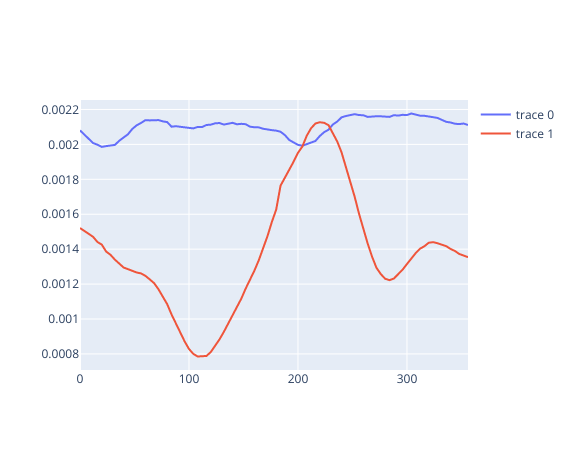

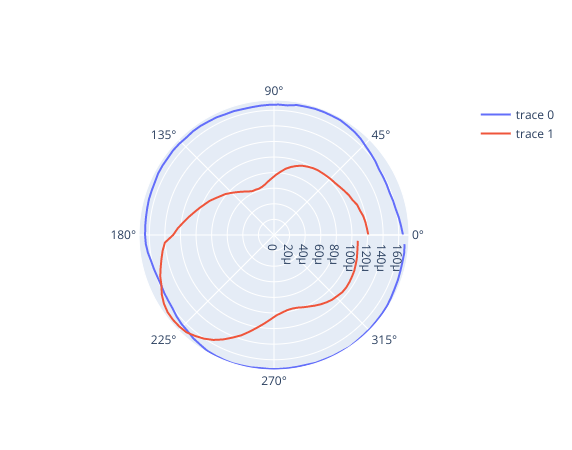

In [10]:
import scipy.io
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

from scipy.integrate import simps

data = scipy.io.loadmat('diag.mat')

theta = data['th'] #Theta coordinates dim = (46,1) 0 to pi
phi =  data['ph'][0] #Phi coordinates dim = (1,90) 0 to 2 pi

#phi = np.concatenate(theta,axis=0)

e_theta = data['v'] #Electric field amplitude theta vector dim =(46,90)
e_phi = data['h'] #Electric field amplitude phi vector dim=(46,90)



e_norm = np.abs(e_phi)**2+np.abs(e_theta)**2 #dim = (46,90)

#I = simps(e_norm,phi,axis=1) + simps(e_norm,theta,axis=0)


#print(I)
fig = go.Figure()
fig.add_trace(go.Scatter(x=phi*180/np.pi,y=e_norm[0]*4*np.pi))
fig.add_trace(go.Scatter(x=phi*180/np.pi,y=e_norm[10]*4*np.pi))
fig.show()


fig = go.Figure()
fig.add_trace(go.Scatterpolar(r=e_norm[0],theta=phi*180/np.pi))
fig.add_trace(go.Scatterpolar(r=e_norm[10],theta=phi*180/np.pi))

fig.show()


#print(mat)

In [ ]:
surface, layout = polar_3d_plot(4*np.pi*e_norm/0.0004893436206633593,theta, phi, title="Directivité: 1 antenna")
fig = go.Figure(data=surface,layout=layout)
fig.write_image("images/dir1antennamodel.pdf")
fig.show()

# Plot pour latex

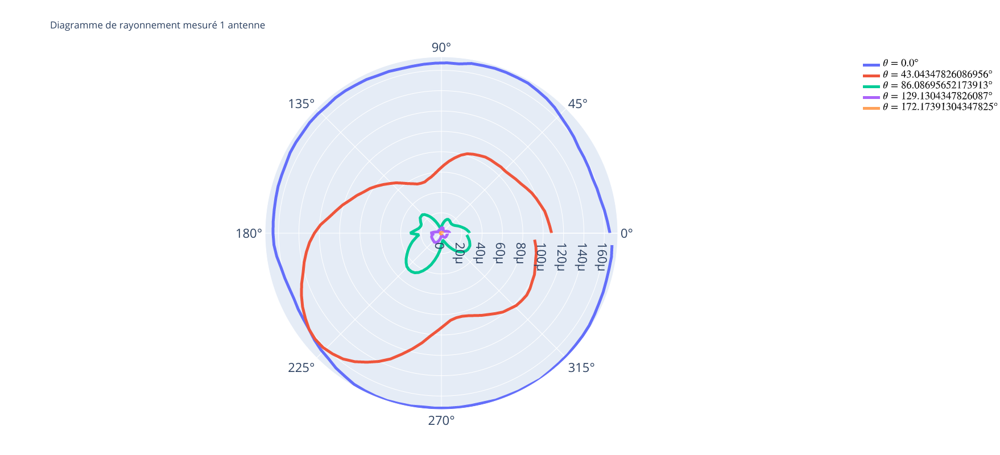

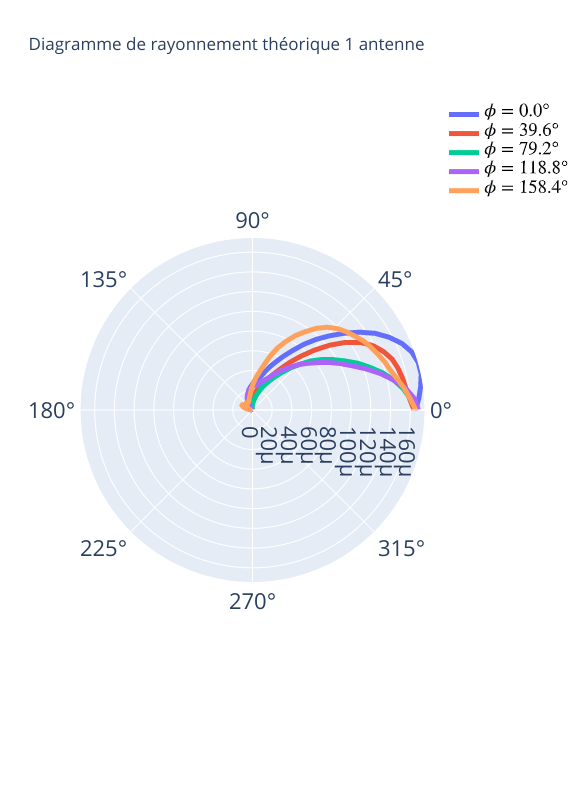

In [185]:
fig = go.Figure()
for i in arange(0,e_norm.shape[0],e_norm.shape[0]//4):
    fig.add_trace(go.Scatterpolar(r=e_norm[i],theta=phi*180/np.pi,name=f"$\\theta={i*180/e_norm.shape[0]}°$",line=dict(width=5)))
    
fig.update_layout(height=800, width=820, title_text="Diagramme de rayonnement mesuré 1 antenne",showlegend=True, legend = dict(font = dict(family = "Courier", size = 30, color = "black")), polar = dict(
      radialaxis_tickfont_size = 22,
      angularaxis = dict(
        tickfont_size=22,
      )
    ))
fig.show()


fig = go.Figure()
for i in arange(0,e_norm.shape[1]//2,e_norm.shape[1]//8):
    fig.add_trace(go.Scatterpolar(r=e_norm[:,i],theta=theta.reshape(1,e_norm.shape[0])[0]*180/np.pi,name=f"$\\phi={i*360/n_phi}°$",line=dict(width=5)))
    
fig.update_layout(height=800, width=820, title_text="Diagramme de rayonnement mesuré 1 antenne",showlegend=True, legend = dict(font = dict(family = "Courier", size = 30, color = "black")), polar = dict(
      radialaxis= dict(tickfont_size = 22),
      angularaxis = dict(
        tickfont_size=22,
      )
    ))
fig.show()


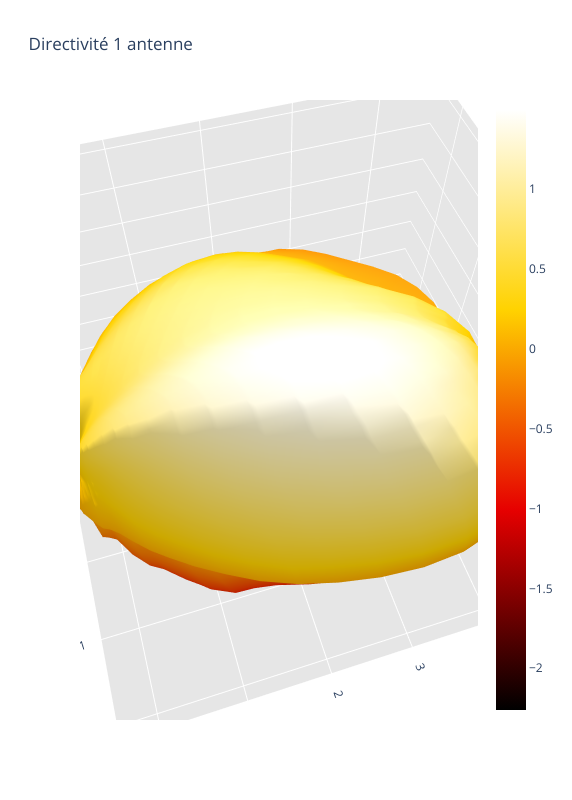

In [186]:
r = 4*np.pi*e_norm/0.0004893436206633593
x = r * np.sin(theta) * np.cos(phi)
y = r * np.cos(theta)
z = r * np.sin(theta) * np.sin(phi)
surface = go.Surface(x=x, y=y, z=z, colorscale='Hot')
data = [surface]
layout = go.Layout(
    title='Directivité 1 antenne',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        )
    )
)
fig = go.Figure(data=data, layout=layout)
fig.update_layout(height=800, width=1000, legend = dict(font = dict(family = "Courier", size = 30, color = "black")))
fig.write_image("images/dir1antenna.pdf")
fig.show()

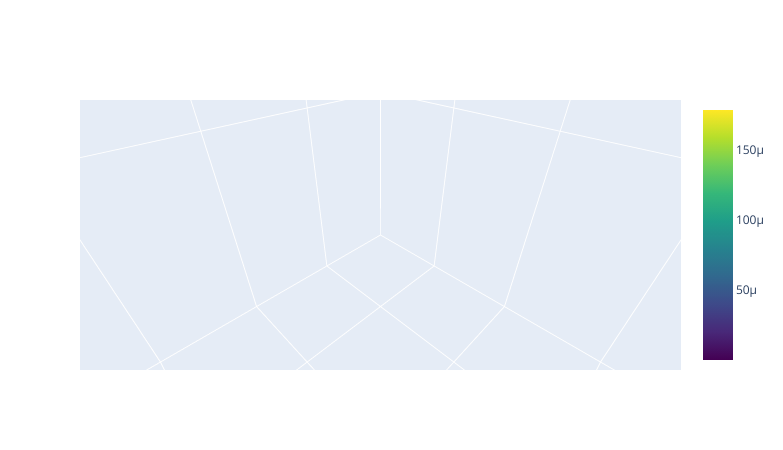

In [3]:
surface = go.Surface(x=theta, y=phi, z=e_norm, colorscale='Viridis')
fig = go.Figure(data=go.Surface(x=theta, y=phi, z=e_norm, colorscale='Viridis'))
fig.show()


# Modélisation 1 antenne

64.00000000000001
(100, 100)


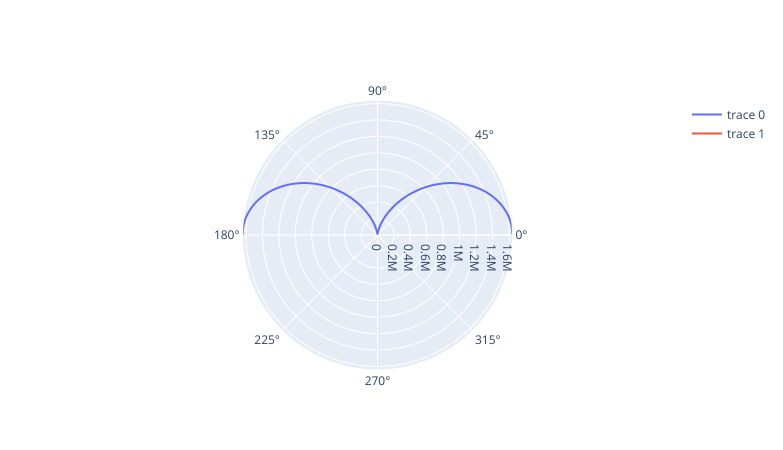

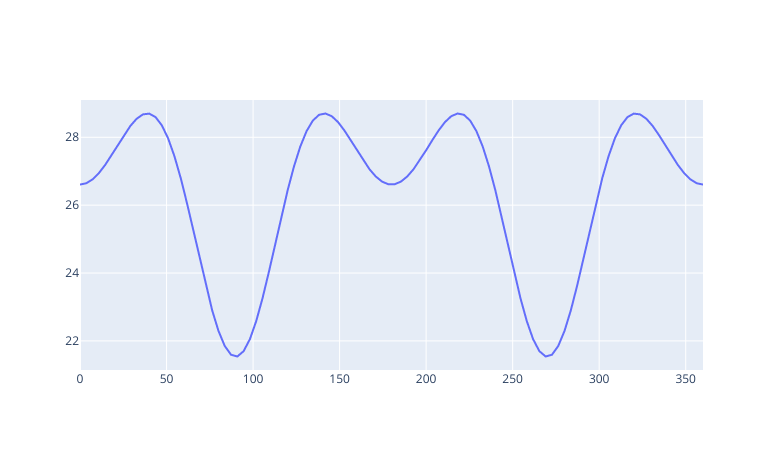

In [23]:
lbda = 3e8/2.4e9 #[m]
k =2*np.pi/lbda
L = 0.34*lbda

#fun_0 = lambda phi, theta: 1j*k/(4*np.pi)*(1+exp(1j*np.cos(phi)*np.sin(theta)*k*L))*np.cos(theta)
#fun_2 = lambda phi, theta: -1j*k/(4*np.pi)*(1+exp(1j*np.cos(phi)*np.sin(theta)*k*L))*np.cos(phi)*np.sin(theta)


fun_0 = lambda phi, theta: 1j*k/(4*np.pi)*(1+exp(1j*np.cos(phi)*np.sin(theta)*k*L))*np.cos(phi)
fun_2 = lambda phi, theta: -1j*k/(4*np.pi)*(1+exp(1j*np.cos(phi)*np.sin(theta)*k*L))*np.cos(theta)*np.sin(phi)

n_phi = 100
n_theta = 100

phi = np.linspace(0,2*np.pi,n_phi).reshape(1,n_phi)
theta =  np.linspace(0,np.pi,n_theta).reshape(n_theta,1) 

f_norm = np.abs(fun_0(phi,theta))**2 + np.abs(fun_2(phi,theta))**2
print(np.max(f_norm))

print(f_norm.shape)

fig = go.Figure()
fig.add_trace(go.Scatterpolar(r=4*np.pi*f_norm[:,25]/0.0004893436206633593,theta=theta.reshape(1,n_theta)[0]*180/np.pi))
fig.add_trace(go.Scatterpolar(r=f_norm[90],theta=phi[0]*180/np.pi))

fig.show()

fig = go.Figure()
fig.add_trace(go.Scatter(y=f_norm[30],x=phi[0]*180/np.pi))
fig.show()



In [22]:
surface, layout = polar_3d_plot(4*np.pi*f_norm/0.0004893436206633593,theta, phi, title="Directivité: 1 antenne")
fig = go.Figure(data=surface,layout=layout)

fig.update_layout(height=800, width=1000, legend = dict(font = dict(family = "Courier", size = 30, color = "black")))

fig.write_image("images/dir1antennamodel.pdf")
fig.show()

## Plot for latex 
Une antenne modélisation

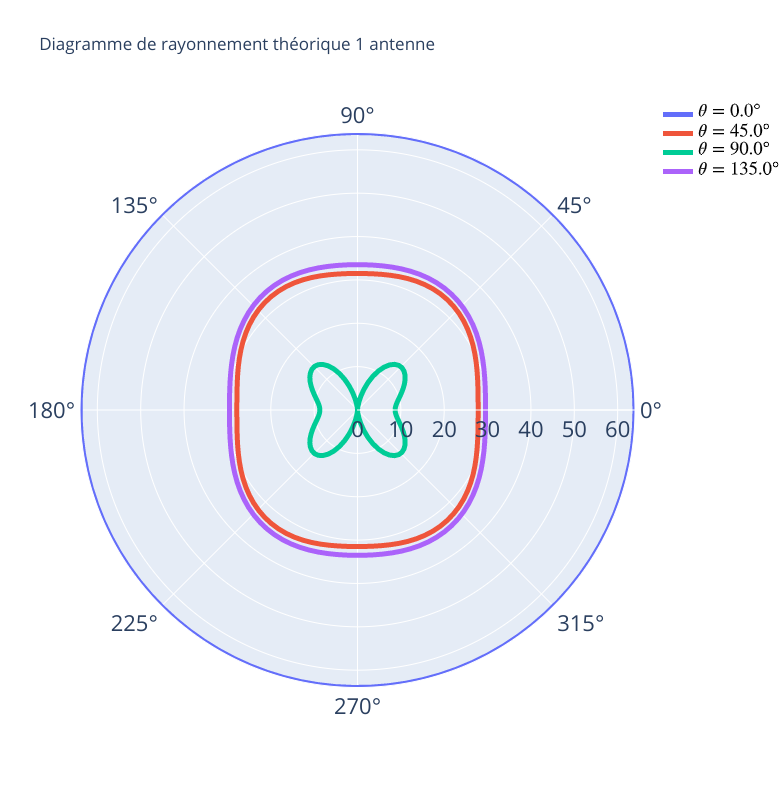

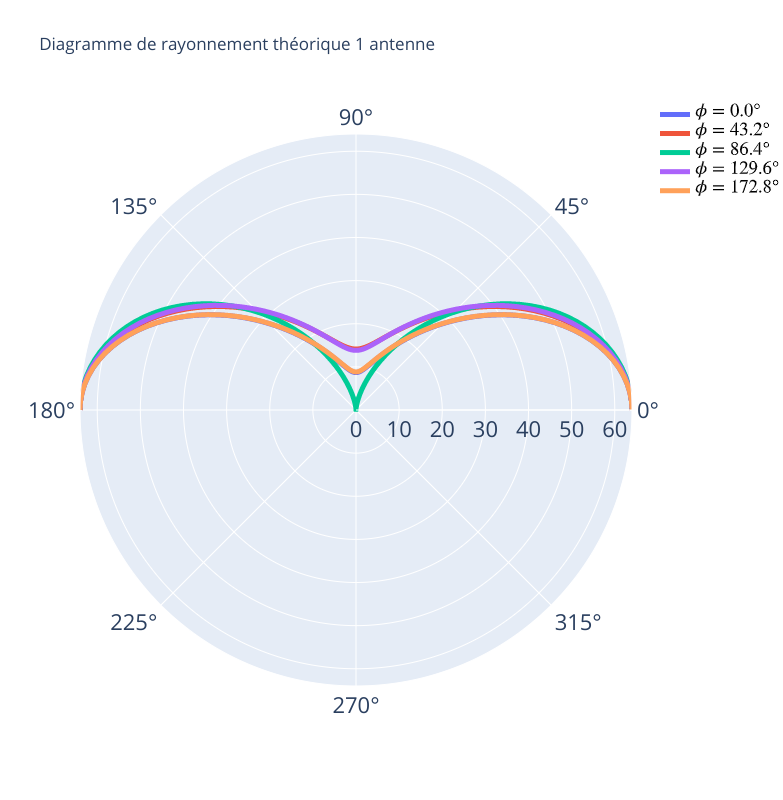

In [175]:
fig = go.Figure()
for i in arange(0,n_theta,n_theta//4):
    fig.add_trace(go.Scatterpolar(r=f_norm[i],theta=phi[0]*180/np.pi,name=f"$\\theta={i*180/n_theta}°$",line=dict(width=5)))
    
fig.update_layout(height=800, width=820, title_text="Diagramme de rayonnement théorique 1 antenne",showlegend=True, legend = dict(font = dict(family = "Courier", size = 30, color = "black")), polar = dict(
      radialaxis_tickfont_size = 22,
      angularaxis = dict(
        tickfont_size=22,
      )
    ))
fig.show()


fig = go.Figure()
for i in arange(0,n_theta//2,n_theta//8):
    fig.add_trace(go.Scatterpolar(r=f_norm[:,i],theta=theta.reshape(1,100)[0]*180/np.pi,name=f"$\\phi={i*360/n_phi}°$",line=dict(width=5)))
    
fig.update_layout(height=800, width=820, title_text="Diagramme de rayonnement théorique 1 antenne",showlegend=True, legend = dict(font = dict(family = "Courier", size = 30, color = "black")), polar = dict(
      radialaxis= dict(tickfont_size = 22),
      angularaxis = dict(
        tickfont_size=22,
      )
    ))
fig.show()


# Array of antenna with good connection

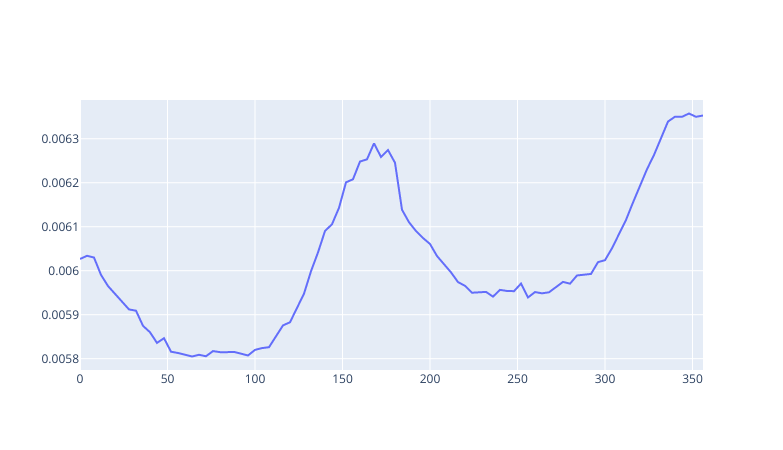

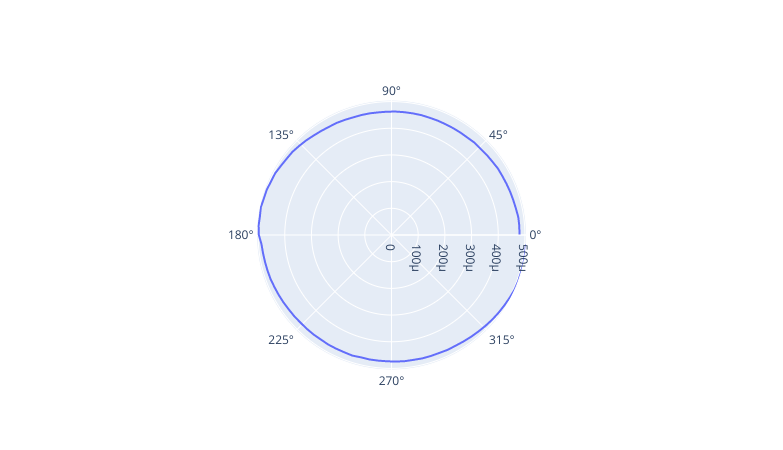

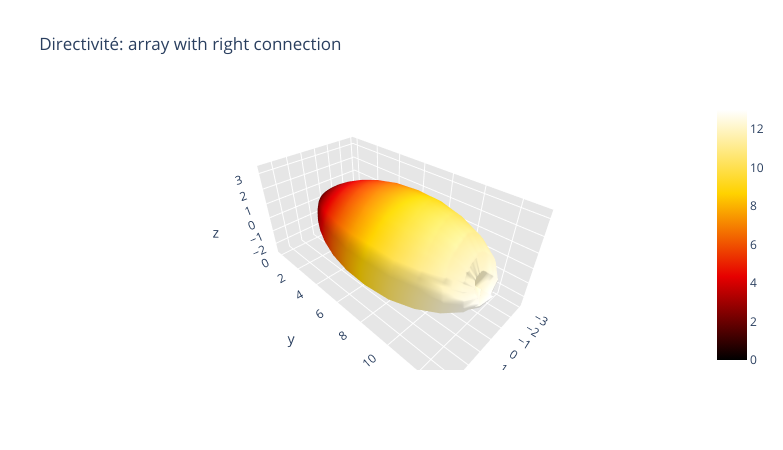

In [19]:
data = scipy.io.loadmat('Arrright.mat')
#print(data)

theta = data['th'] #Theta coordinates dim = (46,1) 0 to pi
phi =  data['ph'][0] #Phi coordinates dim = (1,90) 0 to 2 pi

#phi = np.concatenate(theta,axis=0)

e_theta = data['v'] #Electric field amplitude theta vector dim =(46,90)
e_phi = data['h'] #Electric field amplitude phi vector dim=(46,90)



e_norm = np.abs(e_phi)**2+np.abs(e_theta)**2 #dim = (46,90)


#I = simps(e_norm,phi,axis=1) + simps(e_norm,theta,axis=0)


#print(I)
fig = go.Figure()
fig.add_trace(go.Scatter(x=phi*180/np.pi,y=e_norm[0]*4*np.pi))
fig.show()


fig = go.Figure()
fig.add_trace(go.Scatterpolar(r=e_norm[0],theta=phi*180/np.pi))
fig.show()

surface, layout = polar_3d_plot(4*np.pi*e_norm/0.0004893436206633593,theta, phi, title="Directivité: array with right connection")
fig = go.Figure(data=surface,layout=layout)
fig.write_image("images/dirarrRight.pdf")
fig.show()

# Array with wrong connection

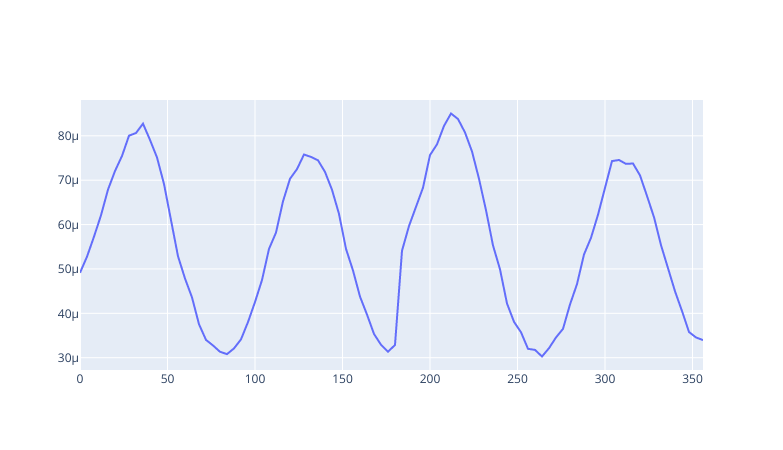

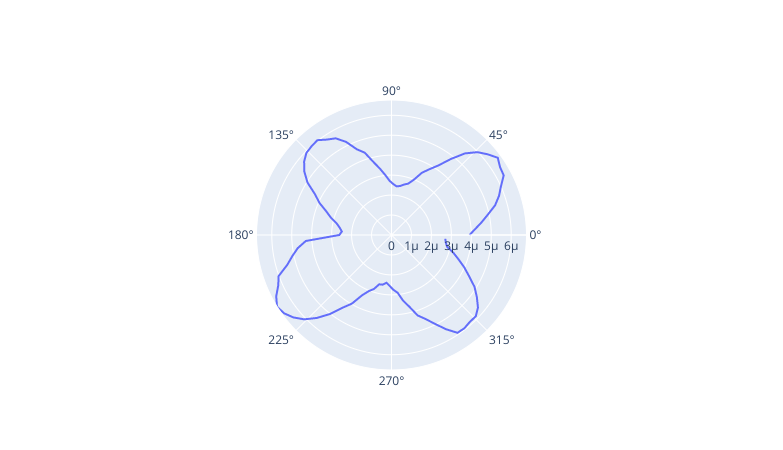

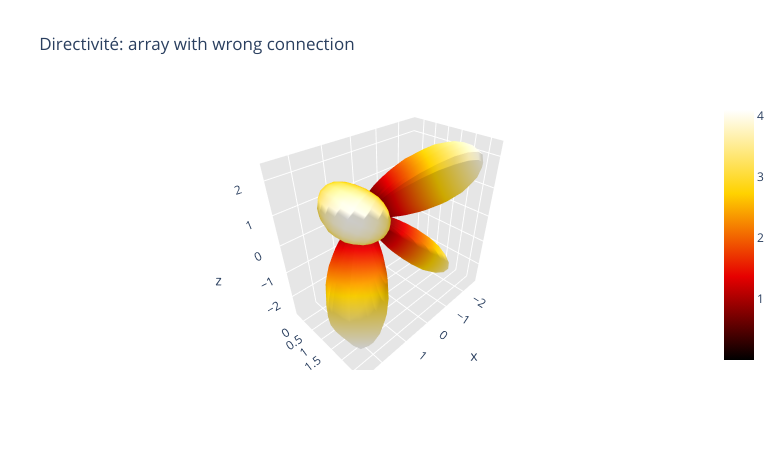

In [18]:
data = scipy.io.loadmat('Arrwrong.mat')
#print(data)

theta = data['th'] #Theta coordinates dim = (46,1) 0 to pi
phi =  data['ph'][0] #Phi coordinates dim = (1,90) 0 to 2 pi

#phi = np.concatenate(theta,axis=0)

e_theta = data['v'] #Electric field amplitude theta vector dim =(46,90)
e_phi = data['h'] #Electric field amplitude phi vector dim=(46,90)



e_norm = np.abs(e_phi)**2+np.abs(e_theta)**2 #dim = (46,90)


#I = simps(e_norm,phi,axis=1) + simps(e_norm,theta,axis=0)


#print(I)
fig = go.Figure()
fig.add_trace(go.Scatter(x=phi*180/np.pi,y=e_norm[0]*4*np.pi))
fig.show()


fig = go.Figure()
fig.add_trace(go.Scatterpolar(r=e_norm[0],theta=phi*180/np.pi))
fig.show()


surface, layout = polar_3d_plot(4*np.pi*e_norm/0.0004893436206633593,theta, phi, title="Directivité: array with wrong connection")
fig = go.Figure(data=surface,layout=layout)
fig.write_image("images/dirarrWrong.pdf")
fig.show()

# Modelisation plusieurs antennes

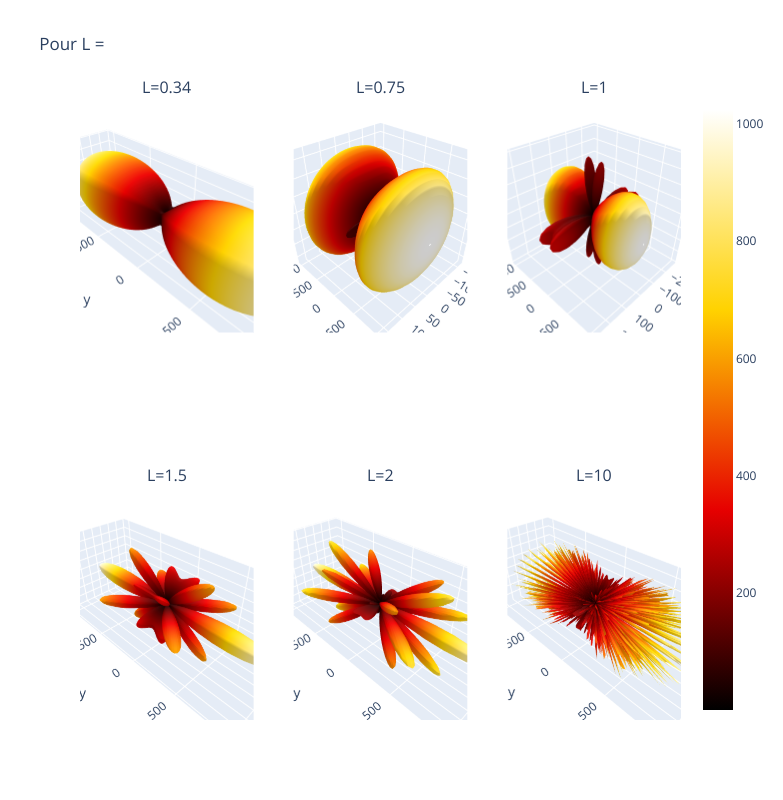

In [17]:


lambd = 0.34

u_x = lambda phi, theta : np.cos(phi)*np.sin(theta)
u_y = lambda phi, theta : np.sin(phi)*np.sin(theta)
# L par rapport à lambda (L = l/lambda)

fun_F = lambda phi, theta, L: -1j*4*(1+np.exp(1j*2*np.pi*lambd*u_x(phi,theta))+
np.exp(1j*2*np.pi*L*u_y(phi,theta))+
np.exp(1j*2*np.pi*(lambd*u_x(phi,theta)+L*u_y(phi,theta)))+
np.exp(1j*2*np.pi*L*u_x(phi,theta))+
np.exp(1j*2*np.pi*(L+lambd)*u_x(phi,theta))+
np.exp(1j*2*np.pi*(L*u_x(phi,theta)+L*u_y(phi,theta)))+
np.exp(1j*2*np.pi*((L+lambd)*u_x(phi,theta)+L*u_y(phi,theta)))
)

fun_x = lambda phi, theta, L : fun_F(phi,theta,L)*np.cos(theta)

fun_z = lambda phi, theta, L : fun_F(phi,theta,L)*np.cos(phi)*np.sin(theta)


phi = np.linspace(0,2*np.pi,100).reshape(1,100)
theta =  np.linspace(0,np.pi,100).reshape(100,1)
Ls=[0.34,0.75,1,1.5,2,10]
fig = make_subplots(
    rows=2, cols=3,
    specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}],
           [{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],subplot_titles=(f"L={Ls[0]}",f"L={Ls[1]}",f"L={Ls[2]}",f"L={Ls[3]}",f"L={Ls[4]}",f"L={Ls[5]}"))

for i in range(0,2):
    for j in range(0,3):
        f_norm = np.abs(fun_x(phi,theta,Ls[i*3+j]))**2 + np.abs(fun_z(phi,theta,Ls[i*3+j]))**2
        surface,layout = polar_3d_plot(f_norm,theta,phi,title=f"Directivité L={Ls[i+j]}",showscale=(i+j==0))
        fig.add_trace(surface,row=i+1,col=j+1)

fig.update_layout(
    title_text='Pour L =',
    height=800,
    width=1200
)

fig.write_image("images/model_4_antenna.pdf")

fig.show()

In [5]:
def polar_3d_plot(f_norm,theta,phi,title="Plot",showscale=True):
    r = f_norm
    x = r * np.sin(theta) * np.cos(phi)
    y = r * np.cos(theta)
    z = r * np.sin(theta) * np.sin(phi)
    surface = go.Surface(x=x, y=y, z=z, colorscale='Hot',showscale=showscale, surfacecolor=(x**2 + y**2 + z**2)**0.5)
    data = [surface]
    layout = go.Layout(
        title=title,
        scene=dict(
            xaxis=dict(
                gridcolor='rgb(255, 255, 255)',
                zerolinecolor='rgb(255, 255, 255)',
                showbackground=True,
                backgroundcolor='rgb(230, 230,230)'
            ),
            yaxis=dict(
                gridcolor='rgb(255, 255, 255)',
                zerolinecolor='rgb(255, 255, 255)',
                showbackground=True,
                backgroundcolor='rgb(230, 230,230)'
            ),
            zaxis=dict(
                gridcolor='rgb(255, 255, 255)',
                zerolinecolor='rgb(255, 255, 255)',
                showbackground=True,
                backgroundcolor='rgb(230, 230,230)'
            )
        )
    )
    fig = go.Figure(data=data, layout=layout)
    return surface,layout


In [ ]:
import os

if not os.path.exists("images"):
    os.mkdir("images")